<a href="https://colab.research.google.com/github/Ron-po/Classifying-Swimming-Styles/blob/main/classifying_strokes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
if not os.path.exists("swimAI"):
  !git clone https://github.com/amyytang/swimAI.git
os.chdir("swimAI")


Cloning into 'swimAI'...
remote: Enumerating objects: 4170, done.
remote: Total 4170 (delta 0), reused 0 (delta 0), pack-reused 4170 (from 1)
Receiving objects: 100% (4170/4170), 336.10 MiB | 37.48 MiB/s, done.
Resolving deltas: 100% (394/394), done.
Updating files: 100% (7000/7000), done.


In [ ]:
from sklearn.model_selection import train_test_split
import os, shutil

# Step 1: Delete and recreate output directory
output_dir = "data_split"
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)
os.makedirs(output_dir)

# Step 2: Define source and destination
base_dir = "swimming_dataset"  # or your Drive path if using Drive
splits = ["train", "val", "test"]
classes = os.listdir(base_dir)

# Step 3: Create split subfolders
for split in splits:
    for cls in classes:
        os.makedirs(os.path.join(output_dir, split, cls), exist_ok=True)

# Step 4: Split each class folder and copy files
for cls in classes:
    cls_path = os.path.join(base_dir, cls)
    files = os.listdir(cls_path)
    trainval, test = train_test_split(files, test_size=0.1, random_state=42)
    train, val = train_test_split(trainval, test_size=0.111, random_state=42)  # ≈10% val

    for split_name, split_files in zip(["train", "val", "test"], [train, val, test]):
        for f in split_files:
            src = os.path.join(cls_path, f)
            dst = os.path.join(output_dir, split_name, cls, f)
            shutil.copy(src, dst)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms


In [ ]:
class ToRGB:
    def __call__(self, img):
        if img.mode == 'P':
            # Convert palette images with transparency to RGBA, then to RGB (drops alpha)
            return img.convert("RGBA").convert("RGB")
        elif img.mode == 'LA':
            return img.convert("RGBA").convert("RGB")
        elif img.mode != 'RGB':
            return img.convert("RGB")
        return img

In [ ]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define transforms for resizing and normalization
train_transform = transforms.Compose([
    ToRGB(),
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # To match ResNet numbers, don't change
])

val_test_transform = transforms.Compose([
    ToRGB(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])


# Path to your split data folders in Drive
data_root = "data_split"

# Load train, val, and test datasets
train_data = datasets.ImageFolder(f"{data_root}/train", transform=train_transform)
val_data   = datasets.ImageFolder(f"{data_root}/val", transform=val_test_transform)
test_data  = datasets.ImageFolder(f"{data_root}/test", transform=val_test_transform)

# Create DataLoaders
train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
val_loader   = DataLoader(val_data, batch_size=32)
test_loader  = DataLoader(test_data, batch_size=32)

print(f"Train set size: {len(train_data)} images")
print(f"Validation set size: {len(val_data)} images")
print(f"Test set size: {len(test_data)} images")
print(f"Total dataset size: {len(train_data) + len(val_data) + len(test_data)} images")


# Optional: Confirm label-to-index mapping
print("Class mapping:", train_data.class_to_idx)



Train set size: 465 images
Validation set size: 49 images
Test set size: 53 images
Total dataset size: 567 images
Class mapping: {'backstroke': 0, 'breastroke': 1, 'butterfly': 2, 'freestyle': 3}


In [ ]:
from collections import Counter
import os
import glob

splits = ['train', 'val', 'test']
data_root = "data_split"

total = 0
for split in splits:
    print(f"\n🔍 {split.upper()} SET")
    split_path = os.path.join(data_root, split)
    for class_name in sorted(os.listdir(split_path)):
        class_path = os.path.join(split_path, class_name)
        image_files = glob.glob(os.path.join(class_path, "*.jpg")) + \
              glob.glob(os.path.join(class_path, "*.png")) + \
              glob.glob(os.path.join(class_path, "*.jpeg")) + \
              glob.glob(os.path.join(class_path, "*.webp"))
        num_images = len(image_files)
        total += num_images
        print(f"{class_name:<12}: {num_images} images")


🔍 TRAIN SET
backstroke  : 98 images
breastroke  : 109 images
butterfly   : 145 images
freestyle   : 110 images

🔍 VAL SET
backstroke  : 11 images
breastroke  : 12 images
butterfly   : 15 images
freestyle   : 11 images

🔍 TEST SET
backstroke  : 12 images
breastroke  : 11 images
butterfly   : 16 images
freestyle   : 13 images


#Baseline Section


In [ ]:
class BaselineCNN(nn.Module):
    def __init__(self):
        super(BaselineCNN, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(16, 32, kernel_size=3, padding=1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1), nn.ReLU(), nn.MaxPool2d(2)
        )
        self.fc = nn.Sequential(
            nn.Linear(64 * 28 * 28, 128), nn.ReLU(), # Changed to fit ResNet18
            nn.Linear(128, 4)  # 4 swimming strokes
        )

    def forward(self, x):
        x = self.conv(x)
        x = x.view(x.size(0), -1)
        return self.fc(x)


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim

# Use GPU if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Create an instance of your model
model = BaselineCNN().to(device)

# Loss function: CrossEntropyLoss for multi-class classification
criterion = nn.CrossEntropyLoss()

# Optimizer: Adam (you can try SGD later for comparison)
optimizer = optim.Adam(model.parameters(), lr=0.001)


Using device: cuda


In [ ]:
num_epochs = 20
best_acc = 0.0
train_losses = []
val_accuracies = []

for epoch in range(1, num_epochs + 1):
    model.train()
    train_loss = 0.0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        train_loss += loss.item() * images.size(0)  # scale by batch size

    # 🔎 Validation phase
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)  # scale by batch size
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    val_acc = correct / total
    train_losses.append(train_loss / len(train_data))
    val_accuracies.append(val_acc)

    print(f"Epoch {epoch}/{num_epochs} — "
          f"Train Loss: {train_loss / len(train_data):.4f} | "
          f"Val Loss:   {val_loss / len(val_data):.4f} | "
          f"Val Acc:    {val_acc:.4f}")

    # Save best model
    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(model.state_dict(), "best_model.pth")


/usr/local/lib/python3.11/dist-packages/PIL/Image.py:1043: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


Epoch 1/20 — Train Loss: 1.5066 | Val Loss:   1.3749 | Val Acc:    0.3036
Epoch 2/20 — Train Loss: 1.3220 | Val Loss:   1.3335 | Val Acc:    0.3929
Epoch 3/20 — Train Loss: 1.2385 | Val Loss:   1.2470 | Val Acc:    0.4643
Epoch 4/20 — Train Loss: 1.1689 | Val Loss:   1.2097 | Val Acc:    0.3929
Epoch 5/20 — Train Loss: 1.0767 | Val Loss:   1.2005 | Val Acc:    0.5179
Epoch 6/20 — Train Loss: 1.0277 | Val Loss:   1.2473 | Val Acc:    0.4643
Epoch 7/20 — Train Loss: 0.9863 | Val Loss:   1.1872 | Val Acc:    0.5536
Epoch 8/20 — Train Loss: 0.8892 | Val Loss:   1.3407 | Val Acc:    0.5357
Epoch 9/20 — Train Loss: 0.9622 | Val Loss:   1.3050 | Val Acc:    0.4464
Epoch 10/20 — Train Loss: 0.9194 | Val Loss:   1.2466 | Val Acc:    0.5179
Epoch 11/20 — Train Loss: 0.8449 | Val Loss:   1.3168 | Val Acc:    0.4643
Epoch 12/20 — Train Loss: 0.7699 | Val Loss:   1.2536 | Val Acc:    0.6071
Epoch 13/20 — Train Loss: 0.7520 | Val Loss:   1.2069 | Val Acc:    0.5000
Epoch 14/20 — Train Loss: 0.6933 |

In [ ]:
model.eval()  # Set to evaluation mode
correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

test_accuracy = correct / total
print(f"\n🎯 Final Test Accuracy: {test_accuracy:.4f}")



🎯 Final Test Accuracy: 0.6667


## Model Predictions on Sample Images

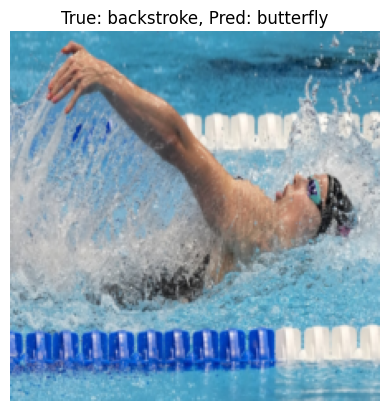

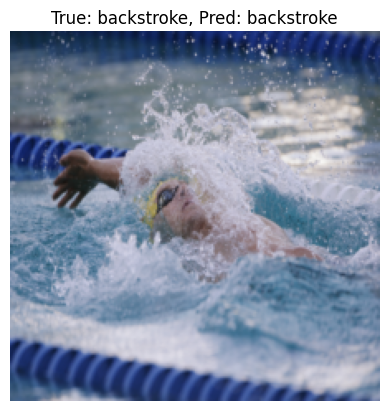

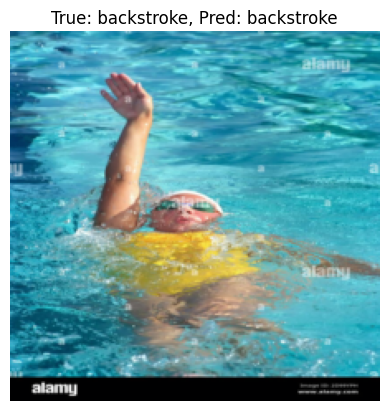

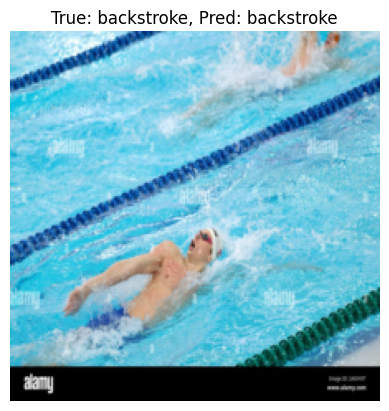

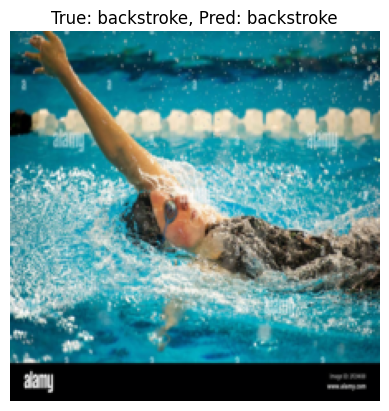

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

classes = test_data.classes  # ['backstroke', 'breaststroke', ...]

# Show 5 predictions
model.eval()
count = 0
for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    outputs = model(images)
    _, preds = torch.max(outputs, 1)

    for i in range(len(images)):
        img = images[i].cpu().permute(1, 2, 0).numpy()
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # un-normalize
        img = np.clip(img, 0, 1)

        true_label = classes[labels[i]]
        pred_label = classes[preds[i]]

        plt.imshow(img)
        plt.title(f"True: {true_label}, Pred: {pred_label}")
        plt.axis('off')
        plt.show()

        count += 1
        if count == 5:
            break
    if count == 5:
        break


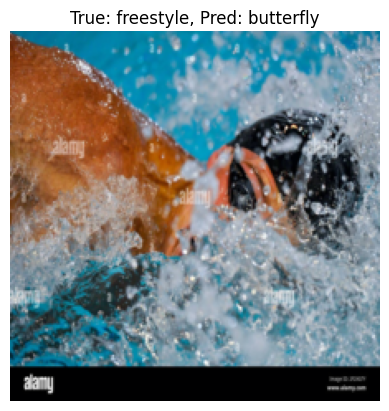

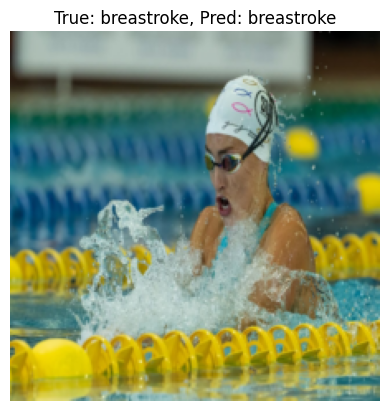

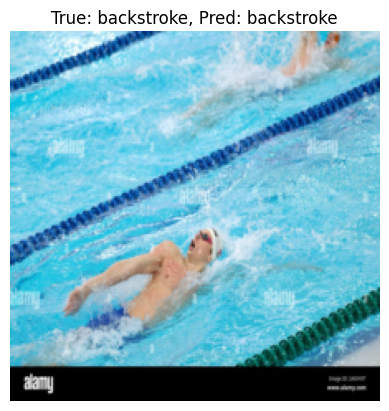

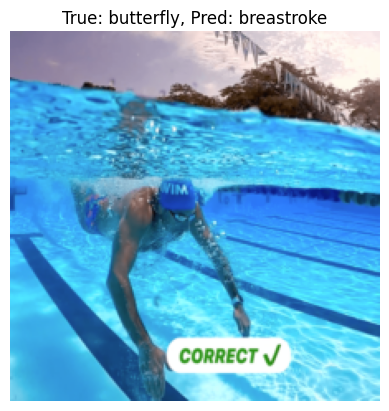

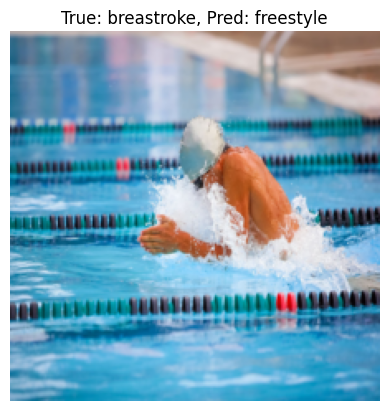

In [ ]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Get random indices from test dataset
num_images = len(test_data)
random_indices = random.sample(range(num_images), 5)

# Un-normalization transform values
mean = np.array([0.485, 0.456, 0.406])
std  = np.array([0.229, 0.224, 0.225])

# Show 5 random images
model.eval()
with torch.no_grad():
    for idx in random_indices:
        image, label = test_data[idx]
        input_tensor = image.unsqueeze(0).to(device)  # add batch dimension
        output = model(input_tensor)
        _, pred = torch.max(output, 1)

        # Convert image back to display format
        img = image.permute(1, 2, 0).numpy()
        img = img * std + mean
        img = np.clip(img, 0, 1)

        plt.imshow(img)
        plt.title(f"True: {classes[label]}, Pred: {classes[pred.item()]}")
        plt.axis('off')
        plt.show()


## Save Results

✅ Results saved to: results/Baseline_results_2025-06-02_20-49-35.txt
✅ Model weights saved to: results/Baseline_weights_2025-06-02_20-49-35.pth


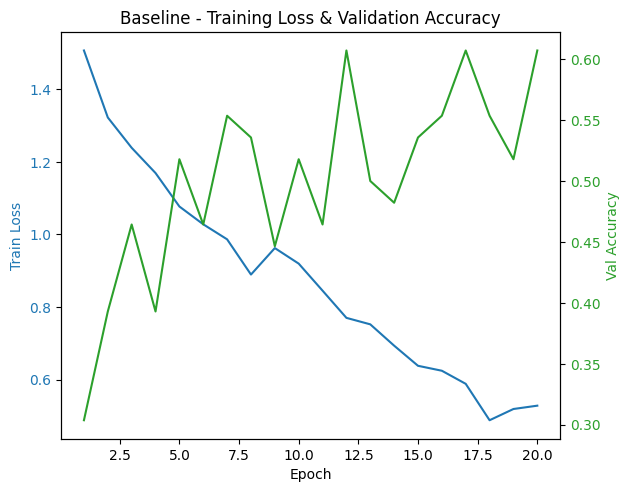

📊 Plot saved to: results/Baseline_plot_2025-06-02_20-49-35.png


In [ ]:
import torch
import datetime
import os
import matplotlib.pyplot as plt
import pytz

model_name = "Baseline"
# Ensure results directory exists
os.makedirs("results", exist_ok=True)

# Use Pacific Time (PT = US/Pacific)
pacific = pytz.timezone("US/Pacific")
timestamp = datetime.datetime.now(pacific).strftime("%Y-%m-%d_%H-%M-%S")

# Filenames with model name included
result_file = f"results/{model_name}_results_{timestamp}.txt"
model_file = f"results/{model_name}_weights_{timestamp}.pth"
plot_file = f"results/{model_name}_plot_{timestamp}.png"

# ✅ Save training summary
with open(result_file, "w") as f:
    f.write(f"Training Summary ({timestamp})\n")
    f.write("="*50 + "\n")
    f.write(f"Model: {model_name}\n")
    f.write(f"Learning rate: 0.001\n")
    f.write(f"Epochs: {num_epochs}\n")
    f.write(f"Train size: {len(train_data)}\n")
    f.write(f"Val size: {len(val_data)}\n")
    f.write(f"Test size: {len(test_data)}\n")
    f.write(f"Final test accuracy: {test_accuracy:.4f}\n")

print(f"✅ Results saved to: {result_file}")

# ✅ Save model weights
torch.save(model.state_dict(), model_file)
print(f"✅ Model weights saved to: {model_file}")

# ✅ Plot training loss and val accuracy
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Train Loss', color=color)
ax1.plot(range(1, num_epochs+1), train_losses, color=color, label='Train Loss')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Val Accuracy', color=color)
ax2.plot(range(1, num_epochs+1), val_accuracies, color=color, label='Val Accuracy')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title(f'{model_name} - Training Loss & Validation Accuracy')
plt.savefig(plot_file)
plt.show()

print(f"📊 Plot saved to: {plot_file}")


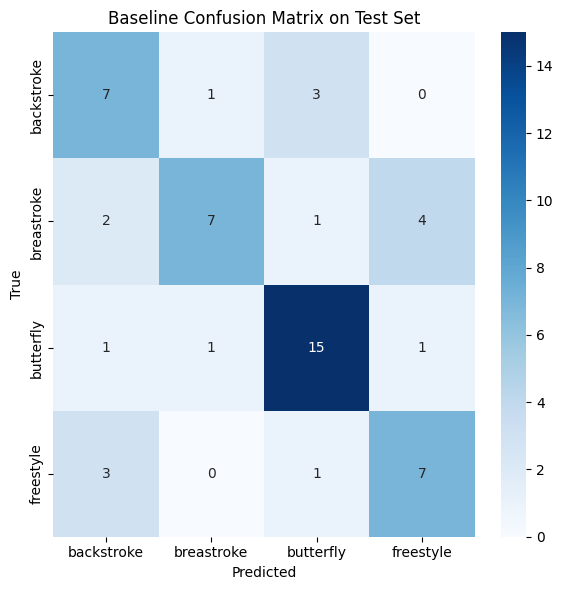

In [ ]:
import torch
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# 1) Put model in eval mode (if not already)
model.eval()

# 2) Collect all predictions and true labels
all_preds  = []
all_labels = []

with torch.no_grad():
    for X, y in test_loader:
        X, y = X.to(device), y.to(device)
        out = model(X)
        preds = out.argmax(dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(y.cpu().numpy())

# 3) Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# 4) Plot with seaborn
plt.figure(figsize=(6,6))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=classes,
    yticklabels=classes
)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Baseline Confusion Matrix on Test Set")
plt.tight_layout()
plt.show()

#ResNet18

In [ ]:
from torchvision import models

# Load pretrained ResNet18
model = models.resnet18(pretrained=True)

# Freeze all layers
for param in model.parameters():
    param.requires_grad = False

# Unfreeze layer4
for param in model.layer4.parameters():
    param.requires_grad = True

# Replace final layer to output 4 classes
num_ftrs = model.fc.in_features  # 512
model.fc = nn.Linear(num_ftrs, 4)  # 4 stroke classes: backstroke, breaststroke, etc.

for param in model.fc.parameters():
    param.requires_grad = True

# Move model to device (GPU if available)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

print("✅ ResNet18 loaded, modified, and ready!")


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 111MB/s]

✅ ResNet18 loaded, modified, and ready!


In [ ]:
from torch.optim.lr_scheduler import OneCycleLR
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.fc.parameters(), lr=0.001)
scheduler = OneCycleLR(
    optimizer,
    max_lr=1e-3,  # peak learning rate
    steps_per_epoch=len(train_loader),
    epochs=num_epochs,
    pct_start=0.3,            # how long to increase LR before decaying
    div_factor=25,            # initial LR = max_lr / div_factor
    final_div_factor=1e4      # final LR = max_lr / final_div_factor
)

In [ ]:
num_epochs = 20
best_acc = 0.0
train_losses = []
val_accuracies = []

import random
import numpy as np

def cutmix_data(x, y, alpha=1.0):
    if alpha <= 0 or random.random() > 0.5:
        return x, y, y, 1.0
    b, C, H, W = x.size()
    lam = np.random.beta(alpha, alpha)
    cut_rat = np.sqrt(1. - lam)
    cut_w, cut_h = int(W * cut_rat), int(H * cut_rat)
    cx, cy = random.randint(0, W), random.randint(0, H)
    x1, x2 = max(cx - cut_w // 2, 0), min(cx + cut_w // 2, W)
    y1, y2 = max(cy - cut_h // 2, 0), min(cy + cut_h // 2, H)
    idx = torch.randperm(b).to(x.device)
    x[:, :, y1:y2, x1:x2] = x[idx, :, y1:y2, x1:x2]
    lam = 1 - ((x2 - x1) * (y2 - y1) / (W * H))
    return x, y, y[idx], lam

for epoch in range(1, num_epochs + 1):
    model.train()
    train_loss = 0.0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        images, ya, yb, lam = cutmix_data(images, labels, alpha=1.0)
        out = model(images)
        loss = lam * criterion(out, ya) + (1 - lam) * criterion(out, yb)
        optimizer.zero_grad()
        outputs = model(images)
        loss.backward()
        optimizer.step()
        scheduler.step()
        train_loss += loss.item() * images.size(0)  # scale by batch size

    # 🔎 Validation phase
    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)  # scale by batch size
            _, preds = torch.max(outputs, 1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    val_acc = correct / total
    train_losses.append(train_loss / len(train_data))
    val_accuracies.append(val_acc)

    print(f"Epoch {epoch}/{num_epochs} — "
          f"Train Loss: {train_loss / len(train_data):.4f} | "
          f"Val Loss:   {val_loss / len(val_data):.4f} | "
          f"Val Acc:    {val_acc:.4f}")

    # Save best model
    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(model.state_dict(), "best_model.pth")


Epoch 1/20 — Train Loss: 1.4290 | Val Loss:   1.4294 | Val Acc:    0.2857
Epoch 2/20 — Train Loss: 1.4215 | Val Loss:   1.4105 | Val Acc:    0.3214
Epoch 3/20 — Train Loss: 1.3519 | Val Loss:   1.3321 | Val Acc:    0.3750
Epoch 4/20 — Train Loss: 1.3129 | Val Loss:   1.2360 | Val Acc:    0.4464
Epoch 5/20 — Train Loss: 1.2729 | Val Loss:   1.1426 | Val Acc:    0.5179
Epoch 6/20 — Train Loss: 1.1822 | Val Loss:   1.0965 | Val Acc:    0.5179
Epoch 7/20 — Train Loss: 1.1392 | Val Loss:   1.0061 | Val Acc:    0.6071
Epoch 8/20 — Train Loss: 1.0932 | Val Loss:   0.9927 | Val Acc:    0.5536
Epoch 9/20 — Train Loss: 1.0087 | Val Loss:   0.9009 | Val Acc:    0.6964
Epoch 10/20 — Train Loss: 1.1077 | Val Loss:   0.9304 | Val Acc:    0.6429
Epoch 11/20 — Train Loss: 0.9655 | Val Loss:   0.8987 | Val Acc:    0.6964
Epoch 12/20 — Train Loss: 0.9397 | Val Loss:   0.8497 | Val Acc:    0.6786
Epoch 13/20 — Train Loss: 0.9821 | Val Loss:   0.8996 | Val Acc:    0.6429
Epoch 14/20 — Train Loss: 0.9556 |

In [ ]:
model.eval()  # Set model to evaluation mode
correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        correct += (preds == labels).sum().item()
        total += labels.size(0)

test_accuracy = correct / total
print(f"\n🎯 Final Test Accuracy (ResNet18): {test_accuracy:.4f}")



🎯 Final Test Accuracy (ResNet18): 0.7593


## Model Predictions on Sample Images

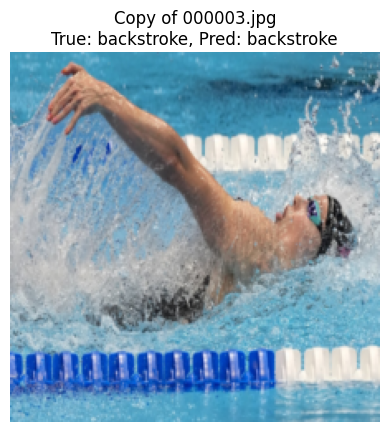

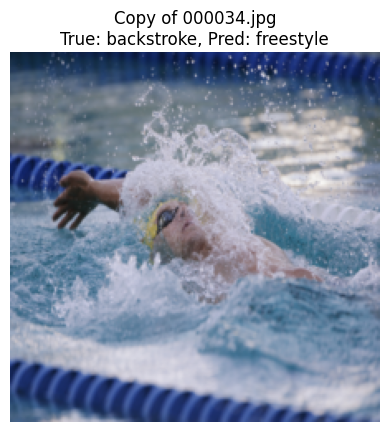

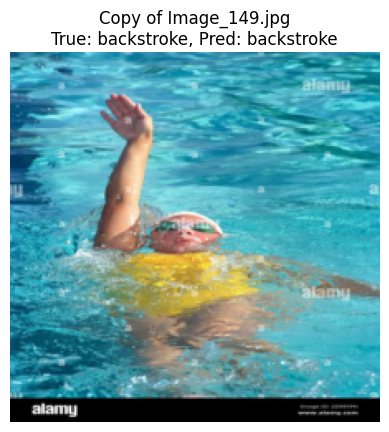

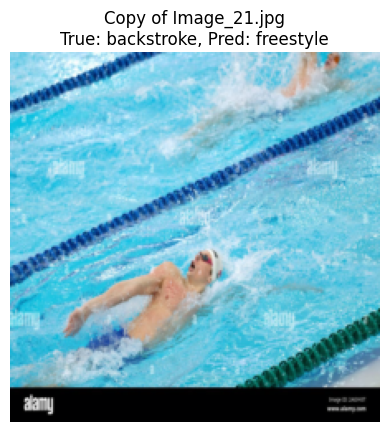

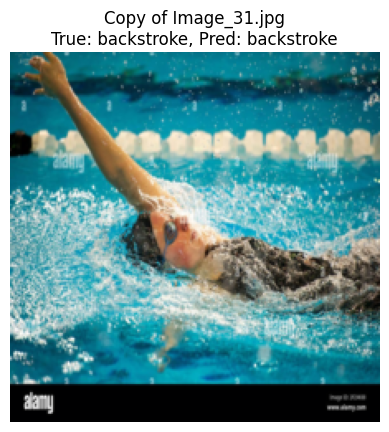

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Get class names from the dataset
classes = test_data.classes

# ImageNet normalization stats
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

# Set model to evaluation mode
model.eval()

# Show 5 sample predictions
shown = 0
max_to_show = 5

with torch.no_grad():
    for batch_idx, (images, labels) in enumerate(test_loader):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)

        for i in range(images.size(0)):
            # Un-normalize and prepare image for display
            img = images[i].cpu().permute(1, 2, 0).numpy()
            img = img * std + mean
            img = np.clip(img, 0, 1)

            # Get filename from test_data.samples
            sample_index = batch_idx * test_loader.batch_size + i
            if sample_index >= len(test_data.samples):
                break
            file_path, _ = test_data.samples[sample_index]
            filename = file_path.split("/")[-1]

            # Plot
            plt.imshow(img)
            plt.title(f"{filename}\nTrue: {classes[labels[i]]}, Pred: {classes[preds[i]]}")
            plt.axis('off')
            plt.show()

            shown += 1
            if shown == max_to_show:
                break
        if shown == max_to_show:
            break


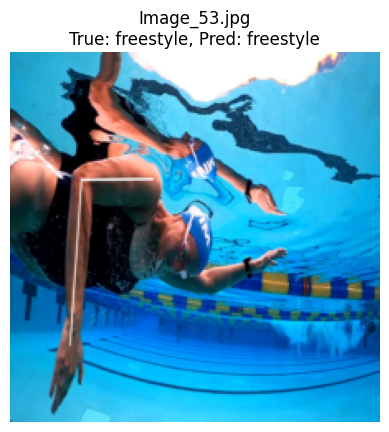

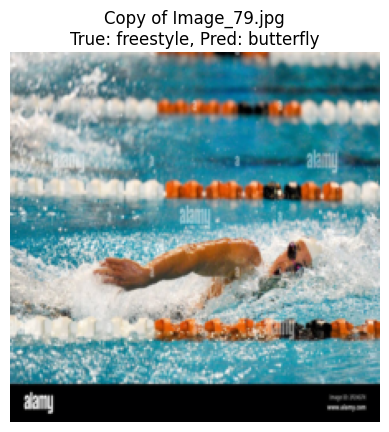

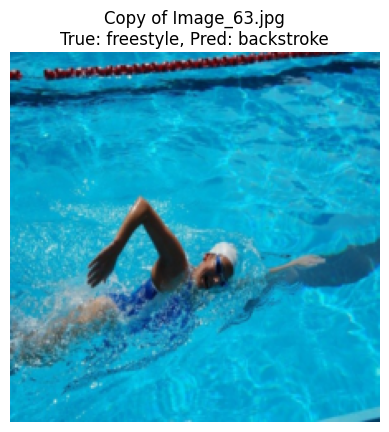

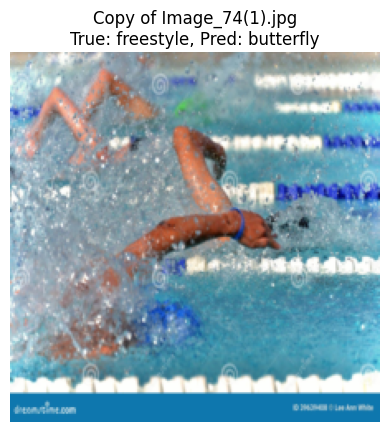

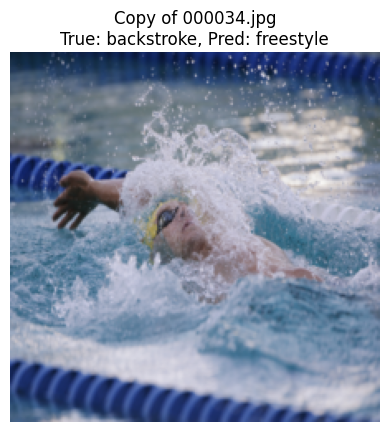

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Get class names
classes = test_data.classes

# Random 5 indices
random_indices = random.sample(range(len(test_data)), 5)

# ImageNet normalization stats
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

model.eval()
with torch.no_grad():
    for idx in random_indices:
        # Load image and label
        image, label = test_data[idx]
        image_tensor = image.unsqueeze(0).to(device)

        # Predict
        output = model(image_tensor)
        _, pred = torch.max(output, 1)

        # Get filename
        file_path, _ = test_data.samples[idx]
        filename = file_path.split("/")[-1]  # or .split("\\")[-1] on Windows

        # Un-normalize for display
        img = image.permute(1, 2, 0).numpy()
        img = img * std + mean
        img = np.clip(img, 0, 1)

        # Plot
        plt.imshow(img)
        plt.title(f"{filename}\nTrue: {classes[label]}, Pred: {classes[pred.item()]}")
        plt.axis('off')
        plt.show()


## Save Results

✅ Results saved to: results/ResNet18_results_2025-06-02_20-37-28.txt
✅ Model weights saved to: results/ResNet18_weights_2025-06-02_20-37-28.pth


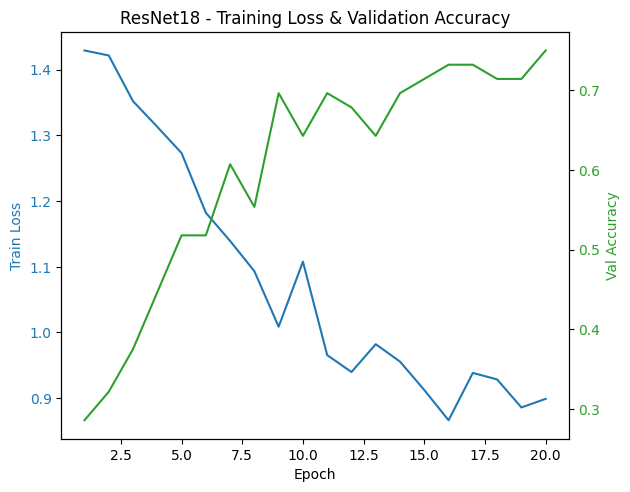

📊 Plot saved to: results/ResNet18_plot_2025-06-02_20-37-28.png


In [ ]:
import torch
import datetime
import os
import matplotlib.pyplot as plt
import pytz

model_name = "ResNet18"
# Ensure results directory exists
os.makedirs("results", exist_ok=True)

# Use Pacific Time (PT = US/Pacific)
pacific = pytz.timezone("US/Pacific")
timestamp = datetime.datetime.now(pacific).strftime("%Y-%m-%d_%H-%M-%S")

# Filenames with model name included
result_file = f"results/{model_name}_results_{timestamp}.txt"
model_file = f"results/{model_name}_weights_{timestamp}.pth"
plot_file = f"results/{model_name}_plot_{timestamp}.png"

# ✅ Save training summary
with open(result_file, "w") as f:
    f.write(f"Training Summary ({timestamp})\n")
    f.write("="*50 + "\n")
    f.write(f"Model: {model_name}\n")
    f.write(f"Learning rate: 0.001\n")
    f.write(f"Epochs: {num_epochs}\n")
    f.write(f"Train size: {len(train_data)}\n")
    f.write(f"Val size: {len(val_data)}\n")
    f.write(f"Test size: {len(test_data)}\n")
    f.write(f"Final test accuracy: {test_accuracy:.4f}\n")

print(f"✅ Results saved to: {result_file}")

# ✅ Save model weights
torch.save(model.state_dict(), model_file)
print(f"✅ Model weights saved to: {model_file}")

# ✅ Plot training loss and val accuracy
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Train Loss', color=color)
ax1.plot(range(1, num_epochs+1), train_losses, color=color, label='Train Loss')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Val Accuracy', color=color)
ax2.plot(range(1, num_epochs+1), val_accuracies, color=color, label='Val Accuracy')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title(f'{model_name} - Training Loss & Validation Accuracy')
plt.savefig(plot_file)
plt.show()

print(f"📊 Plot saved to: {plot_file}")


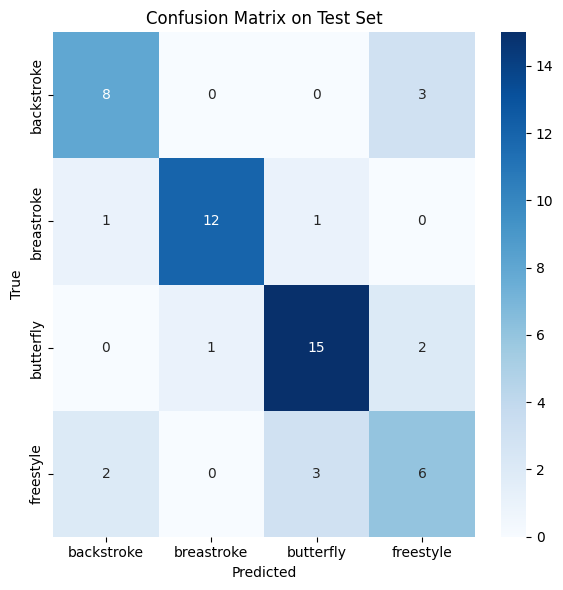

In [ ]:
import torch
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# 1) Put model in eval mode (if not already)
model.eval()

# 2) Collect all predictions and true labels
all_preds  = []
all_labels = []

with torch.no_grad():
    for X, y in test_loader:
        X, y = X.to(device), y.to(device)
        out = model(X)
        preds = out.argmax(dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(y.cpu().numpy())

# 3) Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# 4) Plot with seaborn
plt.figure(figsize=(6,6))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=classes,
    yticklabels=classes
)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix on Test Set")
plt.tight_layout()
plt.show()

#EfficientNetV2-S

In [ ]:
import warnings

# Ignore only the “Palette images with Transparency expressed in bytes”
warnings.filterwarnings(
    "ignore",
    message="Palette images with Transparency expressed in bytes should be converted to RGBA images"
)


In [ ]:

from PIL import Image
import torch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights
import random
import numpy as np
from PIL import Image
import os

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class ToRGB:
    def __call__(self, img):
        # If the image is a paletted PNG with palette‐based transparency,
        # convert to "RGBA" first so that the alpha channel is decoded correctly.
        if img.mode == "P":
            img = img.convert("RGBA")
        # Now convert (RGBA or any other mode) to RGB:
        return img.convert("RGB")


# Transforms (moderate augment + CutMix prep)
mean, std = [0.485,0.456,0.406], [0.229,0.224,0.225]

train_tf = transforms.Compose([
    ToRGB(),
    transforms.RandomResizedCrop(224, scale=(0.9,1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.15, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

val_tf = transforms.Compose([
    ToRGB(),
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean, std),
])

def cutmix_data(x, y, alpha=1.0):
    if alpha <= 0 or random.random() > 0.5:
        return x, y, y, 1.0
    b, C, H, W = x.size()
    lam = np.random.beta(alpha, alpha)
    cut_rat = np.sqrt(1. - lam)
    cut_w, cut_h = int(W * cut_rat), int(H * cut_rat)
    cx, cy = random.randint(0, W), random.randint(0, H)
    x1, x2 = max(cx - cut_w // 2, 0), min(cx + cut_w // 2, W)
    y1, y2 = max(cy - cut_h // 2, 0), min(cy + cut_h // 2, H)
    idx = torch.randperm(b).to(x.device)
    x[:, :, y1:y2, x1:x2] = x[idx, :, y1:y2, x1:x2]
    lam = 1 - ((x2 - x1) * (y2 - y1) / (W * H))
    return x, y, y[idx], lam



# Datasets and DataLoaders
batch_size = 32
train_ds = datasets.ImageFolder(os.path.join(output_dir, "train"), transform=train_tf)
val_ds   = datasets.ImageFolder(os.path.join(output_dir, "val"),   transform=val_tf)
test_ds  = datasets.ImageFolder(os.path.join(output_dir, "test"),  transform=val_tf)

train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True,  num_workers=4)
val_loader   = DataLoader(val_ds,   batch_size=batch_size, shuffle=False, num_workers=4)
test_loader  = DataLoader(test_ds,  batch_size=batch_size, shuffle=False, num_workers=4)

# Build and prepare EfficientNetV2-S
model_name = "EfficientNetV2-S"
model = efficientnet_v2_s(weights=EfficientNet_V2_S_Weights.IMAGENET1K_V1)
in_f = model.classifier[1].in_features

model.classifier[1] = nn.Sequential(
    nn.Dropout(0.5),
    nn.Linear(in_f, len(classes))
)

for p in model.parameters():
    p.requires_grad = False

for p in model.classifier.parameters():
    p.requires_grad = True

for stage in model.features[-2:]:
    for p in stage.parameters():
        p.requires_grad = True

model = model.to(device)

# Optimizer, criterion, scheduler
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
optim_params = filter(lambda p: p.requires_grad, model.parameters())
optimizer = optim.AdamW(optim_params, lr=1e-3, weight_decay=0.01)
scheduler = OneCycleLR(
    optimizer,
    max_lr=1e-3,
    steps_per_epoch=len(train_loader),
    epochs=20,
    pct_start=0.3,
    div_factor=25,
    final_div_factor=1e4
)

# Training
numEpochs = 20
best_acc = 0.0
train_losses = []
val_accuracies = []
for epoch in range(1, numEpochs + 1):
    model.train()
    train_loss = 0.0
    for X, y in train_loader:
        X, y = X.to(device), y.to(device)
        X, ya, yb, lam = cutmix_data(X, y, alpha=1.0)
        out = model(X)
        loss = lam * criterion(out, ya) + (1 - lam) * criterion(out, yb)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        scheduler.step()
        train_loss += loss.item() * X.size(0)

    model.eval()
    val_loss, correct, total = 0.0, 0, 0
    with torch.no_grad():
        for X, y in val_loader:
            X, y = X.to(device), y.to(device)
            out = model(X)
            val_loss += criterion(out, y).item() * X.size(0)
            preds = out.argmax(dim=1)
            correct += (preds == y).sum().item()
            total += y.size(0)

    val_acc = correct / total

    train_losses.append(train_loss)
    val_accuracies.append(val_acc)
    print(f"Epoch {epoch}/{numEpochs} — "
          f"Train Loss: {train_loss/len(train_ds):.4f} | "
          f"Val Loss:   {val_loss/len(val_ds):.4f} | "
          f"Val Acc:    {val_acc:.4f}")

    if val_acc > best_acc:
        best_acc = val_acc
        torch.save(model.state_dict(), "best_model.pth")

# Test accuracy
model.load_state_dict(torch.load("best_model.pth"))
model.eval()
correct, total = 0, 0
with torch.no_grad():
    for X, y in test_loader:
        X, y = X.to(device), y.to(device)
        out = model(X)
        preds = out.argmax(dim=1)
        correct += (preds == y).sum().item()
        total += y.size(0)
test_accuracy = correct / total
print(f"\Final Test Accuracy: {test_accuracy}")


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(
Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth
100%|██████████| 82.7M/82.7M [00:00<00:00, 168MB/s]


Epoch 1/20 — Train Loss: 1.4090 | Val Loss:   1.3570 | Val Acc:    0.3878
Epoch 2/20 — Train Loss: 1.3147 | Val Loss:   1.1472 | Val Acc:    0.5510
Epoch 3/20 — Train Loss: 1.0369 | Val Loss:   0.7616 | Val Acc:    0.8367
Epoch 4/20 — Train Loss: 0.7983 | Val Loss:   0.8493 | Val Acc:    0.7959
Epoch 5/20 — Train Loss: 0.6526 | Val Loss:   0.9848 | Val Acc:    0.6735
Epoch 6/20 — Train Loss: 0.7257 | Val Loss:   0.8423 | Val Acc:    0.7347
Epoch 7/20 — Train Loss: 0.6532 | Val Loss:   0.6714 | Val Acc:    0.8571
Epoch 8/20 — Train Loss: 0.7759 | Val Loss:   0.6807 | Val Acc:    0.7959
Epoch 9/20 — Train Loss: 0.7241 | Val Loss:   0.7261 | Val Acc:    0.8571
Epoch 10/20 — Train Loss: 0.6317 | Val Loss:   0.7620 | Val Acc:    0.8367
Epoch 11/20 — Train Loss: 0.6178 | Val Loss:   0.5959 | Val Acc:    0.9184
Epoch 12/20 — Train Loss: 0.5278 | Val Loss:   0.5590 | Val Acc:    0.9184
Epoch 13/20 — Train Loss: 0.5479 | Val Loss:   0.5425 | Val Acc:    0.9388
Epoch 14/20 — Train Loss: 0.6502 |

## Model Predictions on Sample Images

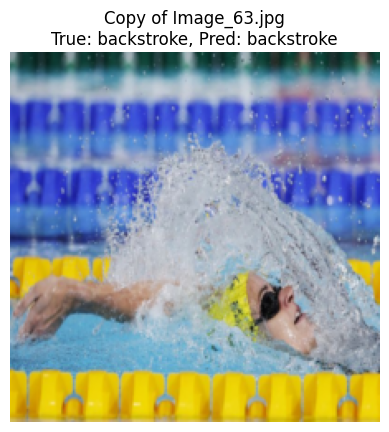

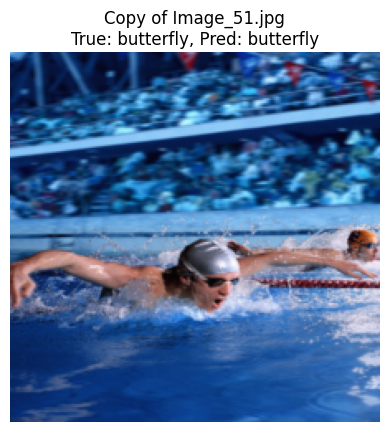

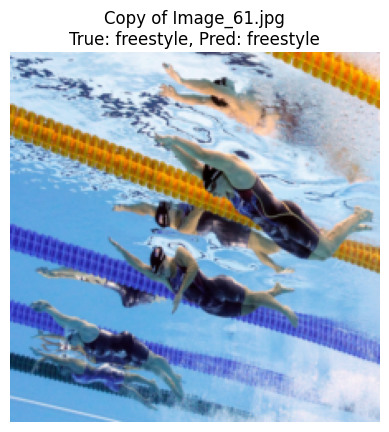

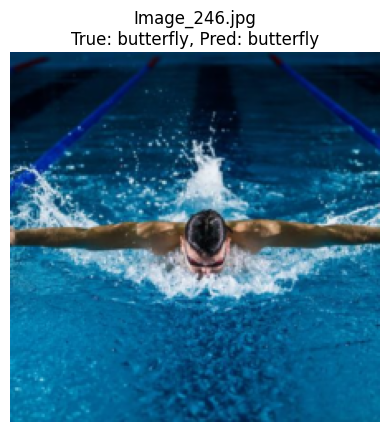

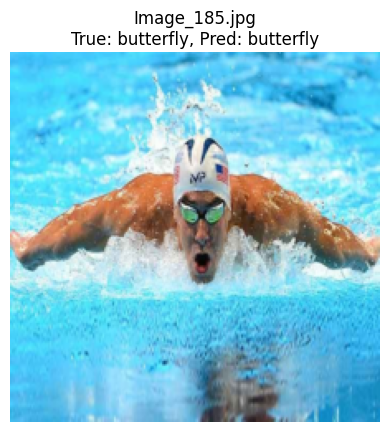

...

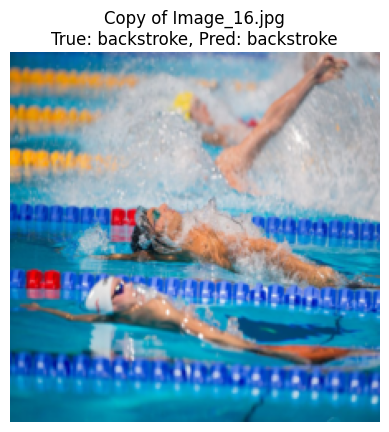

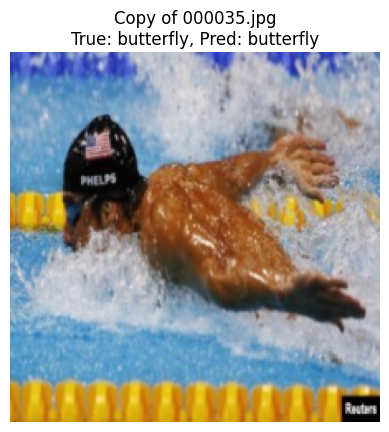

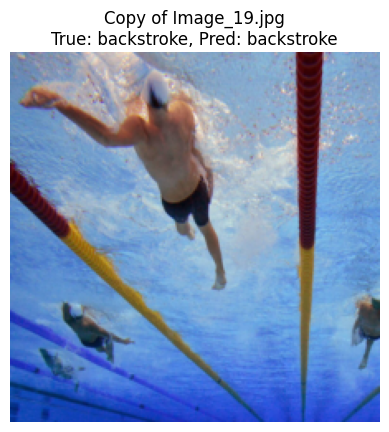

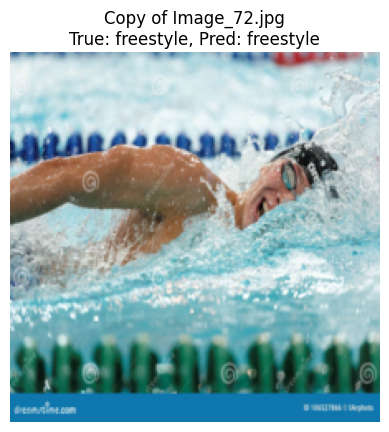

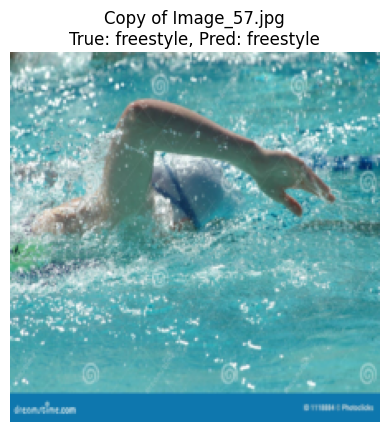

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Get class names
classes = test_data.classes

# Random 5 indices
random_indices = random.sample(range(len(test_data)), 20)

# ImageNet normalization stats
mean = np.array([0.485, 0.456, 0.406])
std = np.array([0.229, 0.224, 0.225])

model.eval()
with torch.no_grad():
    for idx in random_indices:
        # Load image and label
        image, label = test_data[idx]
        image_tensor = image.unsqueeze(0).to(device)

        # Predict
        output = model(image_tensor)
        _, pred = torch.max(output, 1)

        # Get filename
        file_path, _ = test_data.samples[idx]
        filename = file_path.split("/")[-1]  # or .split("\\")[-1] on Windows

        # Un-normalize for display
        img = image.permute(1, 2, 0).numpy()
        img = img * std + mean
        img = np.clip(img, 0, 1)

        # Plot
        plt.imshow(img)
        plt.title(f"{filename}\nTrue: {classes[label]}, Pred: {classes[pred.item()]}")
        plt.axis('off')
        plt.show()

## Save Results

 Results saved to: results/EfficientNetV2-S_results_2025-06-03_18-53-41.txt
 Model weights saved to: results/EfficientNetV2-S_weights_2025-06-03_18-53-41.pth


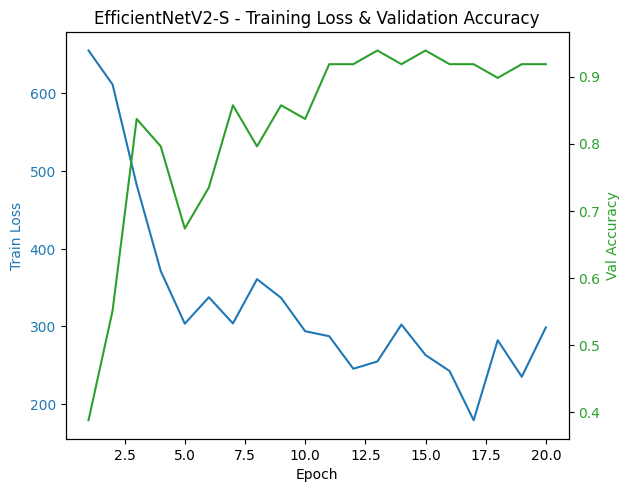

📊 Plot saved to: results/EfficientNetV2-S_plot_2025-06-03_18-53-41.png


In [ ]:
import torch
import datetime
import os
import matplotlib.pyplot as plt
import pytz

model_name = "EfficientNetV2-S"
# Ensure results directory exists
os.makedirs("results", exist_ok=True)

# Use Pacific Time (PT = US/Pacific)
pacific = pytz.timezone("US/Pacific")
timestamp = datetime.datetime.now(pacific).strftime("%Y-%m-%d_%H-%M-%S")

# Filenames with model name included
result_file = f"results/{model_name}_results_{timestamp}.txt"
model_file = f"results/{model_name}_weights_{timestamp}.pth"
plot_file = f"results/{model_name}_plot_{timestamp}.png"

# Save training summary
with open(result_file, "w") as f:
    f.write(f"Training Summary ({timestamp})\n")
    f.write("="*50 + "\n")
    f.write(f"Model: {model_name}\n")
    f.write(f"Learning rate: 0.001\n")
    f.write(f"Epochs: {numEpochs}\n")
    f.write(f"Train size: {len(train_ds)}\n")
    f.write(f"Val size: {len(val_ds)}\n")
    f.write(f"Test size: {len(test_ds)}\n")
    f.write(f"Final test accuracy: {test_accuracy:.4f}\n")

print(f" Results saved to: {result_file}")

# Save model weights
torch.save(model.state_dict(), model_file)
print(f" Model weights saved to: {model_file}")

# Plot training loss and val accuracy
fig, ax1 = plt.subplots()

color = 'tab:blue'
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Train Loss', color=color)
ax1.plot(range(1, numEpochs+1), train_losses, color=color, label='Train Loss')
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()
color = 'tab:green'
ax2.set_ylabel('Val Accuracy', color=color)
ax2.plot(range(1, numEpochs+1), val_accuracies, color=color, label='Val Accuracy')
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()
plt.title(f'{model_name} - Training Loss & Validation Accuracy')
plt.savefig(plot_file)
plt.show()

print(f"📊 Plot saved to: {plot_file}")


/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


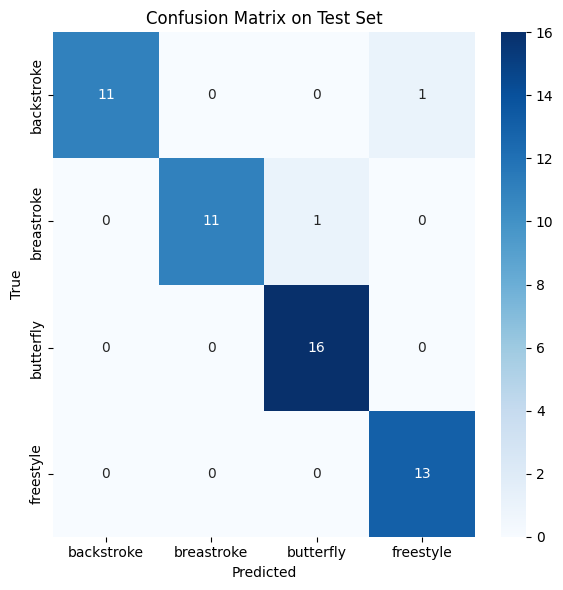

In [ ]:
import torch
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# 1) Put model in eval mode (if not already)
model.eval()

# 2) Collect all predictions and true labels
all_preds  = []
all_labels = []

with torch.no_grad():
    for X, y in test_loader:
        X, y = X.to(device), y.to(device)
        out = model(X)
        preds = out.argmax(dim=1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(y.cpu().numpy())

# 3) Compute confusion matrix
cm = confusion_matrix(all_labels, all_preds)

# 4) Plot with seaborn
plt.figure(figsize=(6,6))
sns.heatmap(
    cm,
    annot=True,
    fmt='d',
    cmap='Blues',
    xticklabels=classes,
    yticklabels=classes
)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix on Test Set")
plt.tight_layout()
plt.show()